In [1]:
import math
import os, sys
from tqdm import tqdm
import pickle

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import binary_dilation

sys.path.append(os.path.join(os.getcwd(), ".."))

from src.detection import compute_frame_differences, get_artifact_mask


In [2]:
def load_image_sequence(file_path, key):
    with open(file_path, "rb") as f:
        image_dict = pickle.load(f)
    image_sequence = image_dict[key]
    return [np.array(img) for img in image_sequence]


def add_circular_border(mask, border_width=2):
    dilated = binary_dilation(mask, iterations=border_width)
    border = dilated & ~mask
    return border


def visualize_artifacts(
    original_image, artifact_mask, alpha=0.5, border_width=2, border_color="green",
):
    if original_image.dtype != np.uint8:
        original_image = (original_image * 255).astype(np.uint8)

    red_fill = np.zeros_like(original_image)
    red_fill[artifact_mask] = [255, 0, 0]

    border_mask = add_circular_border(artifact_mask, border_width)

    green_border = np.zeros_like(original_image)
    green_border[border_mask] = [0, 255, 0] if border_color == "green" else border_color

    result = np.where(
        artifact_mask[:, :, None],
        original_image * (1 - alpha) + red_fill * alpha,
        original_image,
    )
    result = np.where(border_mask[:, :, None], green_border, result)

    return result.astype(np.uint8)

In [3]:
def combined_artifact_analysis(pkl_path, noise_key, t_start=5, t_end=12, mad_scale=7, 
                              min_area=750, max_area=15000, min_width=1, expand_size=4,
                              figsize=(28, 7.5)):
    
    image_sequence = load_image_sequence(pkl_path, noise_key)
    differences = compute_frame_differences(image_sequence[t_start:t_end])
    artifact_mask = get_artifact_mask(image_sequence[t_start:t_end], mad_scale, min_area, max_area, min_width, expand_size)
    final_image = image_sequence[-1]

    artifact_data = []
    non_artifact_data = []

    for diff in differences:
        artifact_data.append(diff[artifact_mask])
        non_artifact_data.append(diff[~artifact_mask])

    artifact_acceleration = np.diff([np.mean(d) for d in artifact_data])
    non_artifact_acceleration = np.diff([np.mean(d) for d in non_artifact_data])

    fig = plt.figure(figsize=figsize, constrained_layout=True)
    gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.8])

    ax1 = fig.add_subplot(gs[0])
    result_image = visualize_artifacts(final_image, artifact_mask, border_width=2, alpha=0.0, border_color=[255,0,0])
    ax1.imshow(result_image)
    ax1.set_title(f"Detected Artifacts ({noise_key})", fontsize=14)
    ax1.axis("off")

    num_images = len(differences)
    cols = math.ceil(math.sqrt(num_images))
    rows = math.ceil(num_images / cols)
    
    inner_gs = gs[1].subgridspec(rows, cols, wspace=0.05, hspace=0.05)
    for i in range(num_images):
        sub_ax = fig.add_subplot(inner_gs[i])
        im = sub_ax.imshow(differences[i].mean(2), cmap='viridis')
        sub_ax.set_title(f"$\Delta_{{{i + t_start + 1}}}$", fontsize=14)
        sub_ax.axis('off')
        fig.colorbar(im, ax=sub_ax, fraction=0.046, pad=0.02)

    ax3 = fig.add_subplot(gs[2])
    ax3.plot(artifact_acceleration, label='Artifact region', color='red', linewidth=2)
    ax3.plot(non_artifact_acceleration, label='Non-artifact region', color='blue', linewidth=2)
    ax3.set_title('Acceleration Comparison', fontsize=14)
    ax3.set_xlabel('Time', fontsize=12)
    ax3.set_ylabel('Acceleration', fontsize=12)
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    plt.show()


#### FFHQ

In [4]:
ffhq_t_start = 5
ffhq_t_end = 16
ffhq_mad_scale = 6
ffhq_min_area = 500
ffhq_max_area = 10000
ffhq_narrow_width = 1

with open("../experiments/normalized_score_dict.pkl", "rb") as f:
    ffhq_artifact_name = list(pickle.load(f).keys())

100%|██████████| 60/60 [00:12<00:00,  4.75it/s]


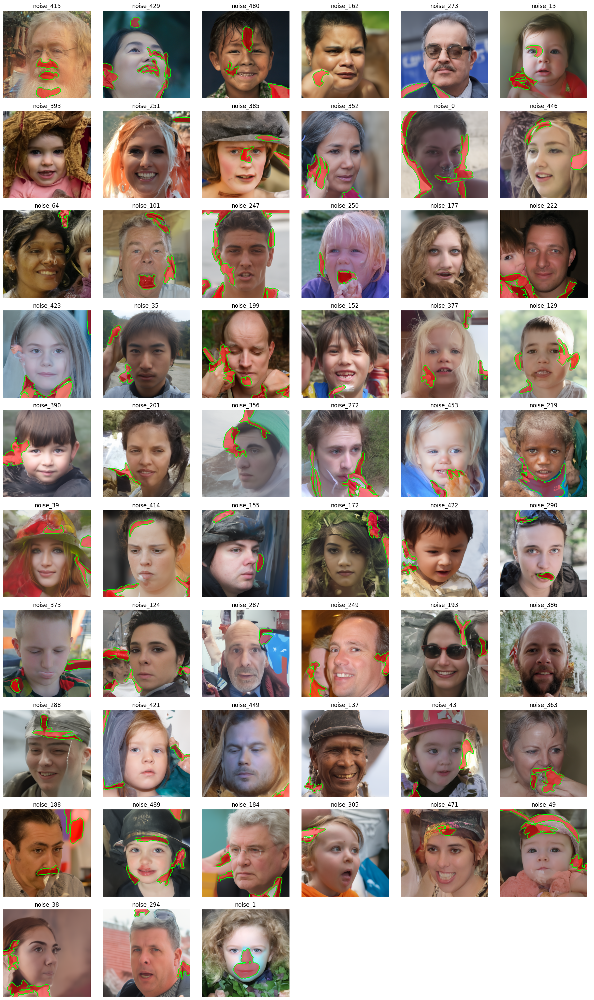

In [5]:
num_images = len(ffhq_artifact_name)
cols = 6 
rows = math.ceil(num_images / cols)

fig, axes = plt.subplots(rows, cols, figsize=(18, 3 * rows))

for i, ax in enumerate(tqdm(axes.flat)):
    if i < num_images:
        image_sequence = load_image_sequence("../experiments/normalized_score_dict.pkl", ffhq_artifact_name[i])
        filtered_mask = get_artifact_mask(image_sequence[ffhq_t_start:ffhq_t_end], ffhq_mad_scale, ffhq_min_area, ffhq_max_area, ffhq_narrow_width)
        final_image = image_sequence[-1]
        result_image = visualize_artifacts(
            final_image, filtered_mask, border_width=2
        )
        im = ax.imshow(result_image)
        ax.set_title(ffhq_artifact_name[i])
        ax.axis("off")
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

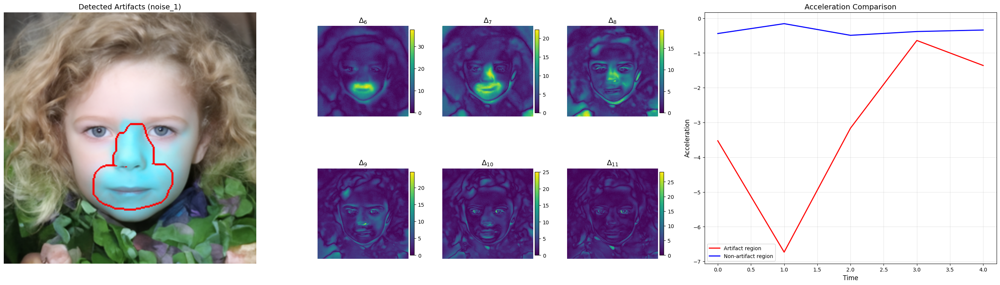

In [6]:
combined_artifact_analysis("../experiments/normalized_score_dict.pkl", "noise_1")

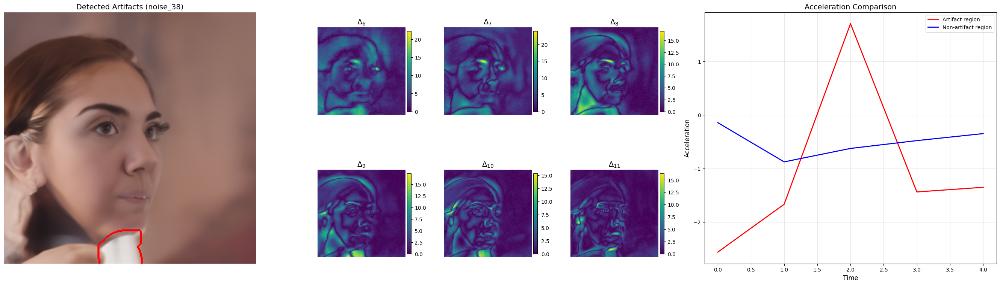

In [7]:
combined_artifact_analysis("../experiments/normalized_score_dict.pkl", "noise_38")

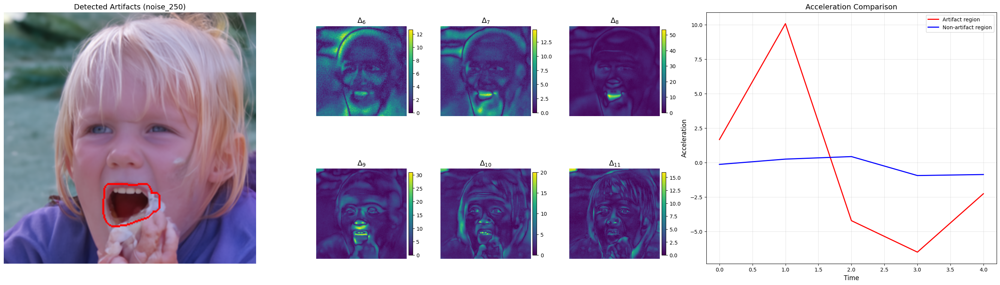

In [8]:
combined_artifact_analysis("../experiments/normalized_score_dict.pkl", "noise_250")

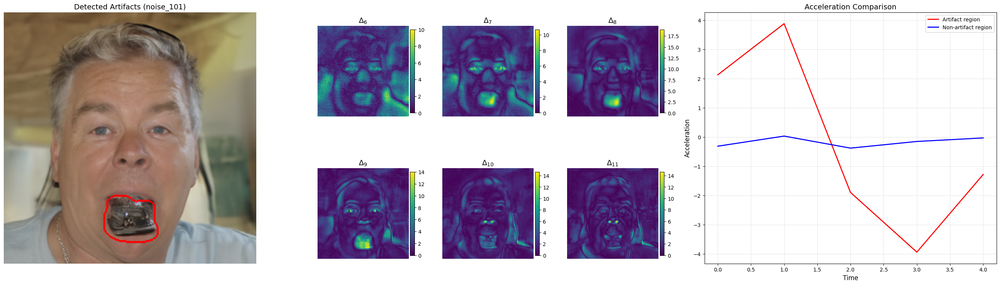

In [9]:
combined_artifact_analysis("../experiments/normalized_score_dict.pkl", "noise_101")